# Вадим Проскуряков. Портфолио как  аналитика данных на август 2022 


На настоящий момент, я к сожалению не могу похвастаться выполнением каких либо абсолютно самостоятельных работ в качестве Data Scientist, однако в процессе получения в Синергии ДПО, мне пришлось выполнить ряд работ в вышеуказанной области под присмотром преподавателя. Некоторые из них  в тех или иных объемах и формах будут представлены ниже. При этом следует понимать, что данная работа не охватывает весь спектр полученных мной знаний и уж тем болеее имеющийся у меня жизненный опыт.   

Итак, имеются наборы данных по энергопотреблению, по зданиям и данные по погоде. Необходимо провести предварительное, а затем и более детальное исследование этих данных, провести предобработку и посторить оптимальную модель(или ансабль моделей) для зависимости энергопотребления заданных зданий от погодных условий. При этом, будут присутствовать некоторые отступления, демонстрирующие тот или иной аспект полученных знаний и умений (scills, if you would like).

Получение и предварительный(разведывательный) анализ данных по погоде.

In [10]:
%matplotlib inline
import numpy as np
import pandas as pd
import pandas_profiling
import matplotlib.pyplot as plt
from matplotlib.pyplot import rcParams
rcParams['figure.figsize']=16, 8

In [11]:
data=pd.read_csv("weather_train.csv")
data=data.loc[data["site_id"]==0]
print(data.head())

   site_id            timestamp  air_temperature  cloud_coverage  \
0        0  2016-01-01 00:00:00             25.0             6.0   
1        0  2016-01-01 01:00:00             24.4             NaN   
2        0  2016-01-01 02:00:00             22.8             2.0   
3        0  2016-01-01 03:00:00             21.1             2.0   
4        0  2016-01-01 04:00:00             20.0             2.0   

   dew_temperature  precip_depth_1_hr  sea_level_pressure  wind_direction  \
0             20.0                NaN              1019.7             0.0   
1             21.1               -1.0              1020.2            70.0   
2             21.1                0.0              1020.2             0.0   
3             20.6                0.0              1020.1             0.0   
4             20.0               -1.0              1020.0           250.0   

   wind_speed  
0         0.0  
1         1.5  
2         0.0  
3         0.0  
4         2.6  


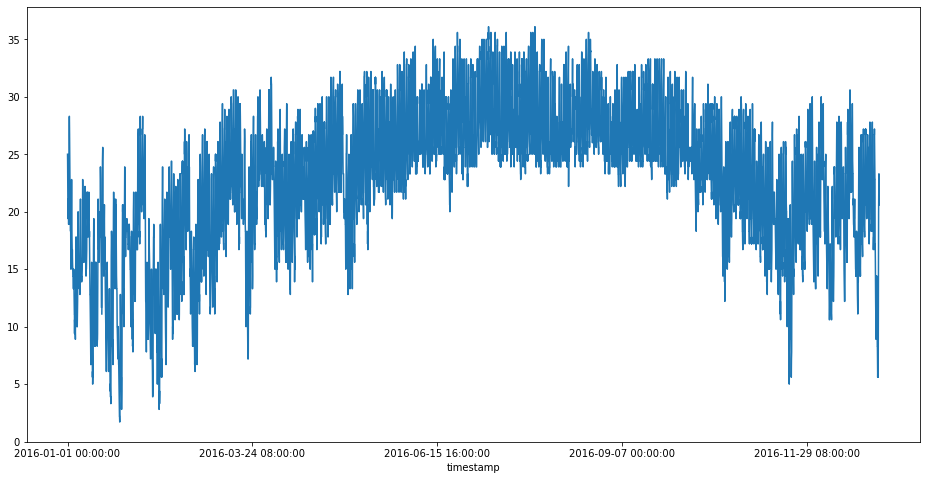

In [12]:
data.set_index("timestamp")["air_temperature"].plot()
plt.show()

In [5]:
data.describe()

,site_id,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
count,8784.0,8781.000000,4954.00000,8781.000000,8783.000000,8699.000000,8534.000000,8784.000000
mean,0.0,22.836021,3.04461,16.817880,1.382557,1017.988378,156.494024,3.375114
std,0.0,6.037417,2.11878,6.519374,12.956933,4.036187,118.344523,2.154266
min,0.0,1.700000,0.00000,-9.400000,-1.000000,992.000000,0.000000,0.000000
25%,0.0,18.900000,2.00000,13.300000,0.000000,1015.500000,60.000000,2.100000
50%,0.0,23.900000,2.00000,18.300000,0.000000,1018.000000,140.000000,3.100000
75%,0.0,26.700000,4.00000,22.200000,0.000000,1020.600000,260.000000,4.600000
max,0.0,36.100000,9.00000,25.600000,343.000000,1030.200000,360.000000,15.400000


In [6]:
pandas_profiling.ProfileReport(data,explorative=True)

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
Получение и предварительный(разведывательный) анализ данных по энергопотреблению.

In [15]:
data_e=pd.read_csv("train.0.0.csv")
print(data_e.head())

   building_id  meter            timestamp  meter_reading
0            0      0  2016-01-01 00:00:00            0.0
1            0      0  2016-01-01 01:00:00            0.0
2            0      0  2016-01-01 02:00:00            0.0
3            0      0  2016-01-01 03:00:00            0.0
4            0      0  2016-01-01 04:00:00            0.0


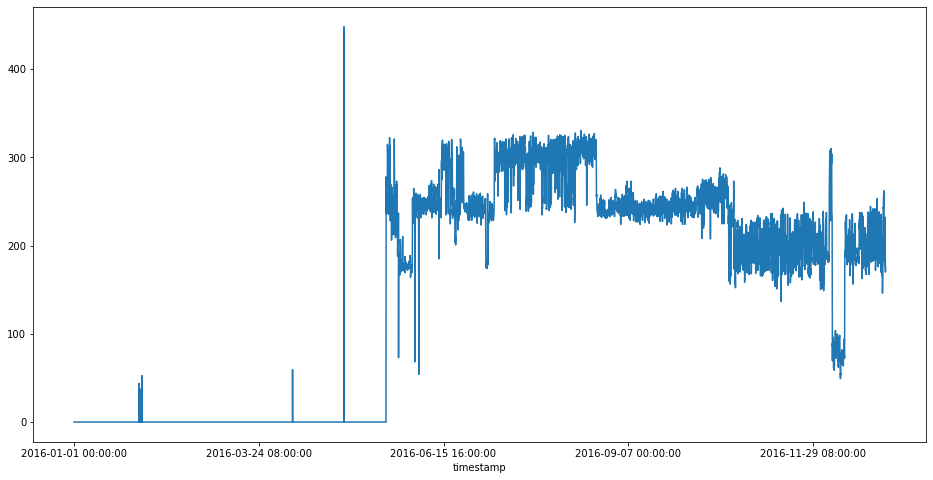

In [16]:
data_e.set_index("timestamp")["meter_reading"].plot()
plt.show()

In [17]:
data_e.describe()

,building_id,meter,meter_reading
count,8784.0,8784.0,8784.000000
mean,0.0,0.0,146.454978
std,0.0,0.0,121.897171
min,0.0,0.0,0.000000
25%,0.0,0.0,0.000000
50%,0.0,0.0,189.752000
75%,0.0,0.0,246.404000
max,0.0,0.0,448.000000


 Преобразование данных ETL (Extract, Transform, Load)

In [18]:
buildings=pd.read_csv("building_metadata.csv")
weather=pd.read_csv('weather_train.csv')
energy_0=pd.read_csv('train.0.0.csv')

Объединяем данные энергопотребления и зданий в одну таблицу по build_id

In [19]:
energy_0=pd.merge(left=energy_0,right=buildings,how="left",left_on='building_id',right_on='building_id')
print(energy_0.head())

   building_id  meter            timestamp  meter_reading  site_id  \
0            0      0  2016-01-01 00:00:00            0.0        0   
1            0      0  2016-01-01 01:00:00            0.0        0   
2            0      0  2016-01-01 02:00:00            0.0        0   
3            0      0  2016-01-01 03:00:00            0.0        0   
4            0      0  2016-01-01 04:00:00            0.0        0   

  primary_use  square_feet  year_built  floor_count  
0   Education         7432      2008.0          NaN  
1   Education         7432      2008.0          NaN  
2   Education         7432      2008.0          NaN  
3   Education         7432      2008.0          NaN  
4   Education         7432      2008.0          NaN  


Объединяем данные зданий-энергопотребления и погоды в одну таблицу по индексам(timestamp) которые затем сбрасываем

In [20]:
energy_0.set_index(['timestamp','site_id'],inplace=True)
weather.set_index(['timestamp','site_id'],inplace=True)
energy_0=pd.merge(left=energy_0,right=weather,how='left',left_index=True,right_index=True)
energy_0.reset_index(inplace=True)
print(energy_0.head())

             timestamp  site_id  building_id  meter  meter_reading  \
0  2016-01-01 00:00:00        0            0      0            0.0   
1  2016-01-01 01:00:00        0            0      0            0.0   
2  2016-01-01 02:00:00        0            0      0            0.0   
3  2016-01-01 03:00:00        0            0      0            0.0   
4  2016-01-01 04:00:00        0            0      0            0.0   

  primary_use  square_feet  year_built  floor_count  air_temperature  \
0   Education         7432      2008.0          NaN             25.0   
1   Education         7432      2008.0          NaN             24.4   
2   Education         7432      2008.0          NaN             22.8   
3   Education         7432      2008.0          NaN             21.1   
4   Education         7432      2008.0          NaN             20.0   

   cloud_coverage  dew_temperature  precip_depth_1_hr  sea_level_pressure  \
0             6.0             20.0                NaN              10

In [21]:
pandas_profiling.ProfileReport(energy_0,explorative=True)

Summarize dataset:   0%|          | 0/30 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Видим из Correlations что энергопотребления(meter_reading) наиболее связано с температурой воздуха(air_temperature)

Заполняем пропуски по погоде в полученной таблице темпратуру, облачность и точку росы заполняем нулями, давление и ветер заполняем средним значением

In [22]:
energy_0['air_temperature'].fillna(0, inplace=True)
energy_0['cloud_coverage'].fillna(0, inplace=True)
energy_0['dew_temperature'].fillna(0, inplace=True)
energy_0['precip_depth_1_hr']=energy_0['precip_depth_1_hr'].apply(lambda x:x if x>0 else 0)
energy_0_sea_level_pressure_mean=energy_0['sea_level_pressure'].mean()

In [23]:
energy_0['air_temperature'].fillna(0, inplace=True)
energy_0['cloud_coverage'].fillna(0, inplace=True)
energy_0['dew_temperature'].fillna(0, inplace=True)
energy_0['precip_depth_1_hr']=energy_0['precip_depth_1_hr'].apply(lambda x:x if x>0 else 0)
energy_0_sea_level_pressure_mean=energy_0['sea_level_pressure'].mean()
energy_0['sea_level_pressure']=energy_0['sea_level_pressure'].apply(lambda x:energy_0_sea_level_pressure_mean if x!=x else x)
energy_0_wind_direction_mean=energy_0['wind_direction'].mean()
energy_0['wind_direction']=energy_0['wind_direction'].apply(lambda x:energy_0_wind_direction_mean if x!=x else x)
energy_0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   timestamp           8784 non-null   object 
 1   site_id             8784 non-null   int64  
 2   building_id         8784 non-null   int64  
 3   meter               8784 non-null   int64  
 4   meter_reading       8784 non-null   float64
 5   primary_use         8784 non-null   object 
 6   square_feet         8784 non-null   int64  
 7   year_built          8784 non-null   float64
 8   floor_count         0 non-null      float64
 9   air_temperature     8784 non-null   float64
 10  cloud_coverage      8784 non-null   float64
 11  dew_temperature     8784 non-null   float64
 12  precip_depth_1_hr   8784 non-null   float64
 13  sea_level_pressure  8784 non-null   float64
 14  wind_direction      8784 non-null   float64
 15  wind_speed          8784 non-null   float64
dtypes: flo

Сохраним результат в файл от греха

In [24]:
energy_0.to_csv('energy_0.csv',index=False)

In [25]:
data=pd.read_csv('energy_0.csv')
print(data.head())

             timestamp  site_id  building_id  meter  meter_reading  \
0  2016-01-01 00:00:00        0            0      0            0.0   
1  2016-01-01 01:00:00        0            0      0            0.0   
2  2016-01-01 02:00:00        0            0      0            0.0   
3  2016-01-01 03:00:00        0            0      0            0.0   
4  2016-01-01 04:00:00        0            0      0            0.0   

  primary_use  square_feet  year_built  floor_count  air_temperature  \
0   Education         7432      2008.0          NaN             25.0   
1   Education         7432      2008.0          NaN             24.4   
2   Education         7432      2008.0          NaN             22.8   
3   Education         7432      2008.0          NaN             21.1   
4   Education         7432      2008.0          NaN             20.0   

   cloud_coverage  dew_temperature  precip_depth_1_hr  sea_level_pressure  \
0             6.0             20.0                0.0              10

Добавление полей по напрвлению ветра,производная температуры,удаление пустых данных и ненужных столбцов

In [26]:
data['wind_direction_rad']=data['wind_direction']*np.pi/180
data['wind_direction_sin']=np.sin(data['wind_direction_rad'])
data['wind_direction_cos']=np.cos(data['wind_direction_rad'])
data=data.drop(labels=['wind_direction_rad'], axis=1)
data['air_temperature1']=data['air_temperature'].diff()
data.at[0,'air_temperature1']=data.at[1,'air_temperature1']
data=data.loc[data['meter_reading']>0]
data=data.drop(labels=['site_id','building_id','meter','primary_use','square_feet','year_built','floor_count','wind_direction'], axis=1)
print(data.head())

                timestamp  meter_reading  air_temperature  cloud_coverage  \
704   2016-01-30 08:00:00        43.6839              8.3             0.0   
725   2016-01-31 05:00:00        37.5408             12.8             0.0   
737   2016-01-31 17:00:00        52.5571             20.6             0.0   
2366  2016-04-08 14:00:00        59.3827             21.7             2.0   
2923  2016-05-01 19:00:00       448.0000             31.1             0.0   

      dew_temperature  precip_depth_1_hr  sea_level_pressure  wind_speed  \
704               6.1                0.0              1019.0         2.1   
725              10.0                0.0              1021.9         0.0   
737              11.7                0.0              1020.9         1.5   
2366             14.4                0.0              1015.1         3.1   
2923             17.2                0.0              1016.1         4.1   

      wind_direction_sin  wind_direction_cos  air_temperature1  
704            

Сохраним от греха в новый файл

In [27]:
data.to_csv('energy_1.csv',index=False)

Необходимые библиотеки будем подгружать по мере необходимости,а не выносить наверх дабы уменьшить сумбурность повествования 

In [28]:
from sklearn.model_selection import train_test_split

Разделим данные на обучающую и проверочную выборки 80/20

In [29]:
data_train,data_test=train_test_split(data,test_size=0.2)
print(data_train.head())

                timestamp  meter_reading  air_temperature  cloud_coverage  \
4592  2016-07-10 08:00:00       292.8180             26.1             0.0   
7456  2016-11-06 16:00:00       173.3700             24.4             0.0   
5528  2016-08-18 08:00:00       309.2000             25.6             2.0   
8216  2016-12-08 08:00:00        93.5107             15.6             0.0   
6209  2016-09-15 17:00:00       228.6580             31.7             0.0   

      dew_temperature  precip_depth_1_hr  sea_level_pressure  wind_speed  \
4592             22.2                0.0              1017.4         0.0   
7456             16.7                0.0              1022.3         3.1   
5528             23.9                0.0              1019.4         2.1   
8216             13.9                0.0              1019.3         3.1   
6209             23.9                0.0              1017.0         2.1   

      wind_direction_sin  wind_direction_cos  air_temperature1  
4592           

Построение модели "среднее по обучающей выборке"

In [37]:
model=float(data_train['meter_reading'].mean())
print('Среднее={0:.4}'.format(model))

Среднее=237.2


Проверка модели на тестовой выборке

In [38]:
err=np.mean(np.abs(data_test['meter_reading']-model))
print('Ошибка={0:.4}%'.format(100*err/model))

Ошибка=14.99%


преобразуем timestamp в дату а час суток в новое поле hour

In [39]:
data['timestamp']=pd.to_datetime(data['timestamp'])
data['hour']=data['timestamp'].dt.hour

Сохраним от греха в новый файл

In [40]:
data.to_csv('energy_2.csv',index=False)

Построение базовой модели. Среднее значение и его ошибка


In [46]:
model=float(data['meter_reading'].mean())
err=np.mean(np.abs(data['meter_reading']-model))
std=np.std(data['meter_reading'])
print('Модель:{0:.4}'.format(model),' ошибка модели:{0:.4}%'.format(100*err/model), ' ошибка данных:{0:.4}%'.format(100*std/model))

Модель:237.7  ошибка модели:15.17%  ошибка данных:20.66%


Модель по 1-му часу

In [48]:
data1=data.loc[data['hour']==1]
print(data1.head())
model1=float(data1['meter_reading'].mean())
err1=np.mean(np.abs(data1['meter_reading']-model1))
print('Модель:{0:.4}'.format(model1),
      ' ошибка модели по 1-му часу:{0:.4}%'.format(100*err1/model1), 
      ' ошибка базовой модели:{0:.4}%'.format(100*err/model))

               timestamp  meter_reading  air_temperature  cloud_coverage  \
3385 2016-05-21 01:00:00        246.404             25.6             0.0   
3409 2016-05-22 01:00:00        264.151             26.7             2.0   
3433 2016-05-23 01:00:00        239.579             25.6             0.0   
3457 2016-05-24 01:00:00        232.753             25.0             4.0   
3481 2016-05-25 01:00:00        215.006             24.4             2.0   

      dew_temperature  precip_depth_1_hr  sea_level_pressure  wind_speed  \
3385             20.6                0.0              1017.9         0.0   
3409             17.8                0.0              1014.1         2.1   
3433             15.6                0.0              1011.8         5.1   
3457             15.6                0.0              1014.9         4.6   
3481             14.4                0.0              1020.3         4.1   

      wind_direction_sin  wind_direction_cos  air_temperature1  hour  
3385           

Преобразование в различные форматы данных, их сравнение

In [49]:
import os
import msgpack
import h5py
import pyarrow.feather as feather

Форматы CSV, Mpack,HDF5,Feather,Parquet и Parquet с сжатием

In [50]:
print('Size of CSV=',round(os.stat('energy_2.csv').st_size/1024),'Kb')

Size of CSV= 569 Kb


In [51]:
data['hour']=data['hour'].astype(np.uint8)
for column in data.columns:
    if column not in ['hour','timestamp']:
        data[column]=data[column].astype(np.float32)
with open('energy_2.mpack','wb') as f:
    f.write(msgpack.packb(data.to_json(), use_bin_type=True))
print('Size of Mpack=',round(os.stat('energy_2.mpack').st_size/1024),'Kb')

Size of Mpack= 1089 Kb


In [52]:
data.to_hdf('energy_2.h5','data',mode='w')
print('Size of HDF5=',round(os.stat('energy_2.h5').st_size/1024),'Kb')

Size of HDF5= 310 Kb


In [53]:
feather.write_feather(data,'energy_2.feather')
print('Size of feather=',round(os.stat('energy_2.feather').st_size/1024),'Kb')

Size of feather= 173 Kb


In [54]:
data.to_parquet('energy_2.parquet')
print('Size of parquet=',round(os.stat('energy_2.parquet').st_size/1024),'Kb')

Size of parquet= 124 Kb


In [55]:
data.to_parquet('energy_2.parquet.br',compression='brotli')
print('Size of parquet with brotli=',round(os.stat('energy_2.parquet.br').st_size/1024),'Kb')

Size of parquet with brotli= 87 Kb


Далее мы будем использовать в качестве основной метрики задачи регрессии среднеквадратичное отклонение логарифма(RMSLE). Однако существует еще ряд других метрик, которые мы вычислим ниже для примера, а именно:  ошибки абсолютная(MAE), относительная(MAPE), средняя квадратичная (MSE),среднеквадратичное отклонение(RMSE).


In [57]:
ensemble=[]
for h in range(24):
    ensemble.append(data[data['hour']==h]['meter_reading'].mean())
print(ensemble)

[238.68368530273438, 239.2115936279297, 239.65142822265625, 240.20364379882812, 239.26307678222656, 238.0503692626953, 237.48257446289062, 240.90426635742188, 242.70452880859375, 235.52267456054688, 234.97357177734375, 234.73085021972656, 235.41949462890625, 237.1426239013672, 236.4920196533203, 237.02439880371094, 237.0274200439453, 234.77963256835938, 236.67018127441406, 237.80264282226562, 237.22592163085938, 237.27426147460938, 238.32525634765625, 239.406494140625]


In [58]:
err_mae=[]
for h in range(24):
    err_mae.extend((data.loc[data['hour']==h]['meter_reading']-ensemble[h]).values)
print('MAE:{0:.4}'.format(np.abs(err_mae).mean()))

MAE:36.11


In [59]:
err_mape=[]
for h in range(24):
    err_mape.extend((1-ensemble[h]/data.loc[data['hour']==h]['meter_reading']).values)
print('MAPE:{0:.4}%'.format(100*np.abs(err_mape).mean()))

MAPE:19.27%


In [60]:
err_mse=[]
for h in range(24):
    err_mse.extend(((ensemble[h]-data.loc[data['hour']==h]['meter_reading'])**2).values)
print('MSE:{0:.5}'.format(np.array(err_mse).mean()))

MSE:2409.6


In [61]:
err_rmse=[]
for h in range(24):
    err_rmse.extend(((ensemble[h]-data.loc[data['hour']==h]['meter_reading'])**2).values)
print('RMSE:{0:.5}'.format(np.array(err_rmse).mean()**0.5))


RMSE:49.088


Линейная регрессия

In [62]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression

Нормализуем температуру и давление


In [63]:
data_norm=MinMaxScaler().fit_transform(data[["air_temperature","sea_level_pressure"]])

Строим модель вида- meter_reading=a x air_temp...+b x ea_lev...+c

In [64]:
x=data_norm
y=data['meter_reading']
model=LinearRegression().fit(x,y)

In [65]:
print('Meter_reading=',int(model.coef_[0]))

Meter_reading= 141


In [67]:
print('air_temperature=',int(model.coef_[1]*(-1)))

air_temperature= 56


In [68]:
print("sea_level_pressure-",int(model.intercept_))

sea_level_pressure- 187


In [69]:
print("Коэфф. определенности R2:",model.score(x,y))

Коэфф. определенности R2: 0.2583271941827804


In [70]:
err_rmsle=(np.log(1+data['meter_reading'])-np.log(1+model.predict(data_norm)))**2
print('RMSLE:{0:.5}'.format((err_rmsle).mean()**0.5))

RMSLE:0.22005


Сравнение метрик регрессий линейной, изотонической, ElasticNet и ансамбля этих регрессий

In [100]:
import optuna
from sklearn.isotonic import IsotonicRegression
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_log_error,mean_squared_error
from sklearn.model_selection import train_test_split

In [101]:
def calculate_bic(y,y_pred,power):
    return len(y)*np.log(len(y)*mean_squared_log_error(y,y_pred)**2)+power*np.log(len(y))

In [102]:
columns=list(data.columns)
columns.remove("timestamp")
columns.remove("meter_reading")
columns.remove("hour")

In [103]:
best_columns=[]
current_columns=[]
power=0
best_power=0
bic_best=10000000
for column in columns:
    current_columns.append(column)
    power+=1
    y=data['meter_reading']
    x=MinMaxScaler().fit_transform(data[current_columns])
    bic=calculate_bic(y,LinearRegression().fit(x,y).predict(x),power)
    if bic<bic_best:
        best_columns.append(column)
        best_power+=1
        bic_best=bic
    else:
        power-=1
        current_columns.remove(column)
print(best_columns)

['air_temperature', 'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure', 'wind_speed', 'air_temperature1', 'air_temperature_2', 'cloud_coverage_2', 'dew_temperature_2', 'sea_level_pressure_2', 'air_temperature_3', 'cloud_coverage_3', 'sea_level_pressure_3', 'wind_direction_cos_3']


In [104]:
for column in columns:
    data[column+"_2"]=np.multiply(data[column],data[column])

In [105]:
for column in columns:
    c=column+"_2"
    current_columns.append(c)
    power+=1
    y=data['meter_reading']
    x=MinMaxScaler().fit_transform(data[current_columns])
    bic=calculate_bic(y,LinearRegression().fit(x,y).predict(x),power)
    if bic<bic_best:
        best_columns.append(c)
        best_power+=1
        bic_best=bic
    else:
        power-=1
        current_columns.remove(c)
print(best_columns)

['air_temperature', 'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure', 'wind_speed', 'air_temperature1', 'air_temperature_2', 'cloud_coverage_2', 'dew_temperature_2', 'sea_level_pressure_2', 'air_temperature_3', 'cloud_coverage_3', 'sea_level_pressure_3', 'wind_direction_cos_3', 'wind_speed_2', 'air_temperature1_2', 'air_temperature_2_2', 'sea_level_pressure_2_2', 'wind_direction_cos_2_2', 'dew_temperature_3_2', 'wind_direction_sin_3_2']


In [106]:
for column in columns:
    data[column+"_3"]=np.multiply(data[column+"_2"],data[column])

In [107]:
for column in columns:
    c=column+"_3"
    current_columns.append(c)
    power+=1
    y=data['meter_reading']
    x=MinMaxScaler().fit_transform(data[current_columns])
    bic=calculate_bic(y,LinearRegression().fit(x,y).predict(x),power)
    if bic<bic_best:
        best_columns.append(c)
        best_power+=1
        bic_best=bic
    else:
        power-=1
        current_columns.remove(c)
print(best_columns)

['air_temperature', 'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure', 'wind_speed', 'air_temperature1', 'air_temperature_2', 'cloud_coverage_2', 'dew_temperature_2', 'sea_level_pressure_2', 'air_temperature_3', 'cloud_coverage_3', 'sea_level_pressure_3', 'wind_direction_cos_3', 'wind_speed_2', 'air_temperature1_2', 'air_temperature_2_2', 'sea_level_pressure_2_2', 'wind_direction_cos_2_2', 'dew_temperature_3_2', 'wind_direction_sin_3_2', 'dew_temperature_3', 'air_temperature1_3']


In [108]:
data_norm=pd.DataFrame(MinMaxScaler().fit_transform(data[best_columns]))

In [109]:
train,test,y_train,y_test=train_test_split(data_norm,data['meter_reading'],test_size=0.2)

In [110]:
def rmsle_err(y,y_pred):
    return((np.log(1+y)-np.log(1+y_pred))**2).mean()**0.5

In [111]:
y=data['meter_reading']
model1=LinearRegression().fit(train,y_train)
print(rmsle_err(y_train,model1.predict(train)))

0.19389309098428337


In [112]:
model2=IsotonicRegression(out_of_bounds='clip').fit(train[0],y_train)
print(rmsle_err(y_train,model2.predict(train[0])))

0.21571802503001733


In [113]:
def ojective_elastic(trial):
    alpha=trial.suggest_float('alpha',1e-8,1,log=True)
    l1_ratio=trial.suggest_float('l1_ratio',1e-3,1,log=True)
    regressor_obj=ElasticNet(alpha=alpha,l1_ratio=l1_ratio,max_iter=10000,tol=1)
    regressor_obj.fit(train,y_train)
    y_pred=regressor_obj.predict(train)
    return mean_squared_log_error(y_train,y_pred)     

In [116]:
study_elastic=optuna.create_study()
study_elastic.optimize(ojective_elastic,n_trials=100)

[I 2022-08-14 18:36:19,513] A new study created in memory with name: no-name-02406552-cc33-472d-828f-60cd1c026792
[I 2022-08-14 18:36:19,534] Trial 0 finished with value: 0.04286164417862892 and parameters: {'alpha': 1.1461920313882008e-05, 'l1_ratio': 0.006023564807757964}. Best is trial 0 with value: 0.04286164417862892.
[I 2022-08-14 18:36:19,555] Trial 1 finished with value: 0.04286237433552742 and parameters: {'alpha': 2.5762995183137054e-06, 'l1_ratio': 0.0011218369669481595}. Best is trial 0 with value: 0.04286164417862892.
[I 2022-08-14 18:36:19,574] Trial 2 finished with value: 0.042808108031749725 and parameters: {'alpha': 0.000563379188093602, 'l1_ratio': 0.01239688254054076}. Best is trial 2 with value: 0.042808108031749725.
[I 2022-08-14 18:36:19,598] Trial 3 finished with value: 0.04286114126443863 and parameters: {'alpha': 1.7359307977147854e-05, 'l1_ratio': 0.0013127427699909221}. Best is trial 2 with value: 0.042808108031749725.
[I 2022-08-14 18:36:19,619] Trial 4 fini

[I 2022-08-14 18:36:21,327] Trial 37 finished with value: 0.04555380716919899 and parameters: {'alpha': 0.15845327765879585, 'l1_ratio': 0.0022701288284335307}. Best is trial 31 with value: 0.041007015854120255.
[I 2022-08-14 18:36:21,374] Trial 38 finished with value: 0.04285258427262306 and parameters: {'alpha': 0.00011396954542040732, 'l1_ratio': 0.001345281942268083}. Best is trial 31 with value: 0.041007015854120255.
[I 2022-08-14 18:36:21,412] Trial 39 finished with value: 0.04992952197790146 and parameters: {'alpha': 0.3339465789718991, 'l1_ratio': 0.0030808422888478812}. Best is trial 31 with value: 0.041007015854120255.
[I 2022-08-14 18:36:21,449] Trial 40 finished with value: 0.04285936430096626 and parameters: {'alpha': 3.871381841934152e-05, 'l1_ratio': 0.015147764614118125}. Best is trial 31 with value: 0.041007015854120255.
[I 2022-08-14 18:36:21,492] Trial 41 finished with value: 0.04101439192891121 and parameters: {'alpha': 0.022157769418421885, 'l1_ratio': 0.0248751560

[I 2022-08-14 18:36:23,384] Trial 74 finished with value: 0.04125508666038513 and parameters: {'alpha': 0.03514673551550659, 'l1_ratio': 0.0574022698332332}. Best is trial 31 with value: 0.041007015854120255.
[I 2022-08-14 18:36:23,430] Trial 75 finished with value: 0.04286258667707443 and parameters: {'alpha': 1.9102354838836406e-08, 'l1_ratio': 0.14022456422127272}. Best is trial 31 with value: 0.041007015854120255.
[I 2022-08-14 18:36:23,473] Trial 76 finished with value: 0.04192724451422691 and parameters: {'alpha': 0.010340865776363848, 'l1_ratio': 0.09034333990789707}. Best is trial 31 with value: 0.041007015854120255.
[I 2022-08-14 18:36:23,534] Trial 77 finished with value: 0.042429883033037186 and parameters: {'alpha': 0.004767110079186872, 'l1_ratio': 0.16614820786903978}. Best is trial 31 with value: 0.041007015854120255.
[I 2022-08-14 18:36:23,586] Trial 78 finished with value: 0.04103274643421173 and parameters: {'alpha': 0.022703734820359582, 'l1_ratio': 0.249994597094057

In [117]:
model3=ElasticNet(alpha=study_elastic.best_params['alpha'],
                 l1_ratio=study_elastic.best_params['l1_ratio'],
                 max_iter=100000,tol=0.01).fit(train,y_train)
print(rmsle_err(y_train,model3.predict(train)))

0.20287747156502714


In [118]:
def objective(trial):
    alpha=trial.suggest_float('alpha',1e-10,1,log=True)
    beta=trial.suggest_float('beta',1e-10,1-alpha,log=True)
    y_pred=(alpha*model1.predict(test)+
           beta*model2.predict(test[0])+
           (1-alpha-beta)*model3.predict(test))
    return mean_squared_log_error(y_test,y_pred)

In [119]:
study=optuna.create_study()
study.optimize(objective,n_trials=100)

[I 2022-08-14 18:37:42,642] A new study created in memory with name: no-name-346b2688-bdce-4fff-8102-7af8410d6a23
[I 2022-08-14 18:37:42,679] Trial 0 finished with value: 0.04376380518078804 and parameters: {'alpha': 2.9764707004981414e-10, 'beta': 0.5176276387364015}. Best is trial 0 with value: 0.04376380518078804.
[I 2022-08-14 18:37:42,706] Trial 1 finished with value: 0.042104754596948624 and parameters: {'alpha': 3.205463337814846e-09, 'beta': 0.020485229141891353}. Best is trial 1 with value: 0.042104754596948624.
[I 2022-08-14 18:37:42,732] Trial 2 finished with value: 0.04048578441143036 and parameters: {'alpha': 0.2257306545413705, 'beta': 7.006406177649965e-07}. Best is trial 2 with value: 0.04048578441143036.
[I 2022-08-14 18:37:42,760] Trial 3 finished with value: 0.04204769805073738 and parameters: {'alpha': 0.006191608680626135, 'beta': 1.1675603567684234e-05}. Best is trial 2 with value: 0.04048578441143036.
[I 2022-08-14 18:37:42,784] Trial 4 finished with value: 0.042

[I 2022-08-14 18:37:44,675] Trial 37 finished with value: 0.04202279821038246 and parameters: {'alpha': 0.009417704303910732, 'beta': 3.2896554157215605e-10}. Best is trial 20 with value: 0.037053365260362625.
[I 2022-08-14 18:37:44,730] Trial 38 finished with value: 0.046781864017248154 and parameters: {'alpha': 0.001490448079997282, 'beta': 0.9020741149922044}. Best is trial 20 with value: 0.037053365260362625.
[I 2022-08-14 18:37:44,792] Trial 39 finished with value: 0.04209441691637039 and parameters: {'alpha': 0.00015975329053629346, 'beta': 3.6954329183710244e-05}. Best is trial 20 with value: 0.037053365260362625.
[I 2022-08-14 18:37:44,864] Trial 40 finished with value: 0.042095646262168884 and parameters: {'alpha': 5.32168464210913e-08, 'beta': 2.046892811159059e-06}. Best is trial 20 with value: 0.037053365260362625.
[I 2022-08-14 18:37:44,934] Trial 41 finished with value: 0.037283092737197876 and parameters: {'alpha': 0.9040692412603961, 'beta': 1.779930275342432e-09}. Best

[I 2022-08-14 18:37:46,821] Trial 74 finished with value: 0.04186496138572693 and parameters: {'alpha': 0.030049127393758885, 'beta': 8.693939444404968e-10}. Best is trial 68 with value: 0.03702637925744057.
[I 2022-08-14 18:37:46,871] Trial 75 finished with value: 0.03915630653500557 and parameters: {'alpha': 0.45075214745679637, 'beta': 2.466143396218665e-10}. Best is trial 68 with value: 0.03702637925744057.
[I 2022-08-14 18:37:46,908] Trial 76 finished with value: 0.042095646262168884 and parameters: {'alpha': 3.942075549474177e-10, 'beta': 1.5262577756187218e-09}. Best is trial 68 with value: 0.03702637925744057.
[I 2022-08-14 18:37:46,950] Trial 77 finished with value: 0.04144517704844475 and parameters: {'alpha': 0.08652067890615367, 'beta': 7.320449517891142e-09}. Best is trial 68 with value: 0.03702637925744057.
[I 2022-08-14 18:37:46,988] Trial 78 finished with value: 0.03727182000875473 and parameters: {'alpha': 0.9078930484006763, 'beta': 1.1930893876678825e-06}. Best is tr

In [120]:
print(study.best_params)

{'alpha': 0.9986180725593957, 'beta': 4.675313993855959e-08}


In [122]:
y_pred1=model1.predict(data_norm)
y_pred2=model2.predict(data_norm[0])
y_pred3=model3.predict(data_norm)
y_pred=(study.best_params['alpha']*y_pred1+
       study.best_params['beta']*y_pred2+
       (1-study.best_params['alpha']-study.best_params['beta'])*y_pred3)
print('Среднеквадратичные отклонения логарифмов(RMSLE):')
print('по линейной регрессии',rmsle_err(y,y_pred1))
print('по изотонической регрессии',rmsle_err(y,y_pred2))
print('по ElasticNet',rmsle_err(y,y_pred3))
print('по ансамблю',rmsle_err(y,y_pred))


Среднеквадратичные отклонения логарифмов(RMSLE):
по линейной регрессии 0.19359771411953616
по изотонической регрессии 0.2163000858605647
по ElasticNet 0.20333886808506288
по ансамблю 0.19360327510169387


Вывод - объективно наименьшую принятую метрику мы имеем при использовании линейной регрессии, то есть использование других регрессий, как впрочем и ансамблей из них не дает такую точность для нашего случая.Посему наиболе оптимальный вариант, судя по имеющимся исходным данным - использовать модель линейной регрессии.